Parametri globali

In [1]:
alpha=0.2
nfold=10

Import librerie

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import re
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import word_tokenize 
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.model_selection import StratifiedKFold
from sklearn import metrics
import seaborn as sns
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support
from sklearn.naive_bayes import ComplementNB
from sklearn.pipeline import make_pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from lime import lime_text
import unicodedata

Import dataset

In [3]:
df = pd.read_excel('./politica.xlsx', sheet_name="Foglio1")
print(f'Found {len(df)} texts.')

print(f'{df["cap_maj_master"].isnull().sum()} document(s) with no classification removed')
df=df[pd.notnull(df['cap_maj_master'])]

print(f'{df["testo"].isnull().sum()} document(s) with no text removed')
df=df[pd.notnull(df['testo'])]

classes = [int(c) for c in df['cap_maj_master']]
documents = [d for d in df['testo']]

Found 5674 texts.
2 document(s) with no classification removed
424 document(s) with no text removed


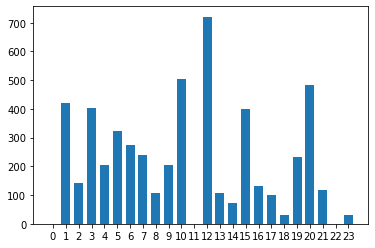

In [4]:
y = np.bincount(classes)
x = np.arange(len(y))
fig, ax = plt.subplots()
plt.bar(x, y,width=0.7)
ax.set_xticks(x)
ax.set_aspect('auto')
plt.show()


preprocessing

In [5]:
def preprocessor(text):
    text = re.sub('<[^>]*>', ' ', str(text))
    text=re.sub('\d+',' ',str(text))
    text=re.sub('[ﾫﾻ]','',str(text))
    emoticons = re.findall('(?::|;|=)(?:-)?(?:\)|\(|D|P)',
                           str(text))
    text = (re.sub('[\W]+', ' ', text.lower()) + ' ' +
            ' '.join(emoticons).replace('-', ''))
    return text

def strip_accents(text):
    """
    Strip accents from input String.

    :param text: The input string.
    :type text: String.

    :returns: The processed String.
    :rtype: String.
    """
    try:
        text = unicode(text, 'utf-8')
    except (TypeError, NameError): # unicode is a default on python 3 
        pass
    text = unicodedata.normalize('NFD', text)
    text = text.encode('ascii', 'ignore')
    text = text.decode("utf-8")
    return str(text)

stop=set(stopwords.words('italian'))

def tokenizer_porter(text):
    word_tokens = word_tokenize(text)
    stemmer = SnowballStemmer("italian", ignore_stopwords=True)
    return [stemmer.stem(word) for word in word_tokens]
  

def tokenizer(text):
    stop=set(stopwords.words('italian'))
    word_tokens = word_tokenize(text)
    filtered_sentence = [w for w in word_tokens if not w in stop]
    filtered_sentence = [w for w in filtered_sentence if len(w)>3]
    return filtered_sentence

create vocabolary

In [6]:
tfidf = TfidfVectorizer(strip_accents=strip_accents,
                        lowercase=False,
                        preprocessor=preprocessor,
                        tokenizer=tokenizer_porter,
                        stop_words=stop,
                        min_df = 4
                       )

final_features = tfidf.fit_transform(documents)

In [7]:
X_names=tfidf.get_feature_names()
x_best_s=SelectKBest(chi2, k="all")
p_value_limit = 0.95

Text(0.5, 1.0, 'Sparse Matrix Sample')

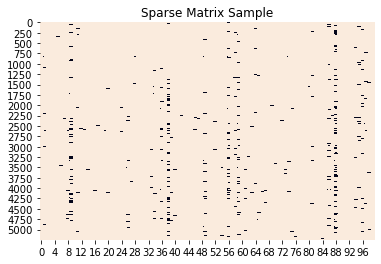

In [8]:
sns.heatmap(final_features.todense()[:,np.random.randint(0,final_features.shape[1],100)]==0, vmin=0, vmax=1, cbar=False).set_title('Sparse Matrix Sample')

In [9]:

dtf_features = pd.DataFrame()
for cat in np.unique(classes):
    appoggio=(cat==classes)
    appoggio.astype(int)
    xbest=x_best_s.fit_transform(final_features, appoggio)
    p = x_best_s.pvalues_
    dtf_features = dtf_features.append(pd.DataFrame(
                   {"feature":X_names, "score":1-p, "y":cat}))
    dtf_features = dtf_features.sort_values(["y","score"], 
                    ascending=[True,False])
    dtf_features = dtf_features[dtf_features["score"]>p_value_limit]
X_names = dtf_features["feature"].unique().tolist()

In [10]:
for cat in np.unique(classes):
    print("# {}:".format(cat))
    print("  . selected features:",
         len(dtf_features[dtf_features["y"]==cat]))
    print("  . top features:", ",".join(
dtf_features[dtf_features["y"]==cat]["feature"].values[:10]))
    print(" ")

# 1:
  . selected features: 136
  . top features: mezzogiorn,fiat,industrial,inflazion,fiscal,produtt,tern,occupazional,imeres,eni
 
# 2:
  . selected features: 163
  . top features: crocifiss,islam,omosessual,religion,relig,unar,razzial,cattol,confession,cult
 
# 3:
  . selected features: 211
  . top features: farmac,medic,ospedal,ospedalier,pazient,sal,sanitar,vaccin,embrion,malatt
 
# 4:
  . selected features: 182
  . top features: agricol,agricoltor,agricoltur,allev,animal,latt,pesc,produttor,produzion,bovin
 
# 5:
  . selected features: 115
  . top features: lavor,pension,pensionist,infortun,sindacal,inps,forner,previdenzial,voucher,disoccup
 
# 6:
  . selected features: 111
  . top features: abilit,alunn,didatt,docent,format,graduator,insegn,istruzion,paritar,scolast
 
# 7:
  . selected features: 238
  . top features: ambiental,bonif,discar,inquin,rif,smalt,acque,termovalorizz,ecoball,ambient
 
# 8:
  . selected features: 130
  . top features: elettr,energ,energet,gas,gasdott,nuc

In [11]:
tfidf = TfidfVectorizer(strip_accents=strip_accents,
                        lowercase=False,
                        preprocessor=preprocessor,
                        tokenizer=tokenizer_porter,
                        stop_words=stop,
                        min_df = 4,
                        vocabulary=X_names
                       )

final_features = tfidf.fit_transform(documents)

Text(0.5, 1.0, 'Sparse Matrix Sample')

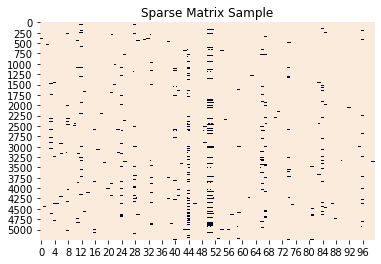

In [12]:
sns.heatmap(final_features.todense()[:,np.random.randint(0,final_features.shape[1],100)]==0, vmin=0, vmax=1, cbar=False).set_title('Sparse Matrix Sample')

In [13]:
print(final_features.toarray().shape)

(5248, 2612)


In [14]:
pipe_lr = make_pipeline(
                        tfidf,
                        ComplementNB(alpha=alpha)
                        )

--------------- Fold:  1 ---------------------

Accuracy: 0.74
Auc: 0.98
Detail:
              precision    recall  f1-score   support

           1       0.57      0.67      0.62        42
           2       0.67      0.53      0.59        15
           3       0.88      0.90      0.89        40
           4       0.91      0.95      0.93        21
           5       0.70      0.72      0.71        32
           6       0.74      0.96      0.84        27
           7       0.81      0.92      0.86        24
           8       0.73      1.00      0.85        11
           9       0.61      0.85      0.71        20
          10       0.79      0.96      0.86        50
          12       0.75      0.84      0.79        73
          13       0.71      0.45      0.56        11
          14       1.00      0.57      0.73         7
          15       0.85      0.55      0.67        40
          16       0.89      0.62      0.73        13
          17       0.75      0.60      0.67        10


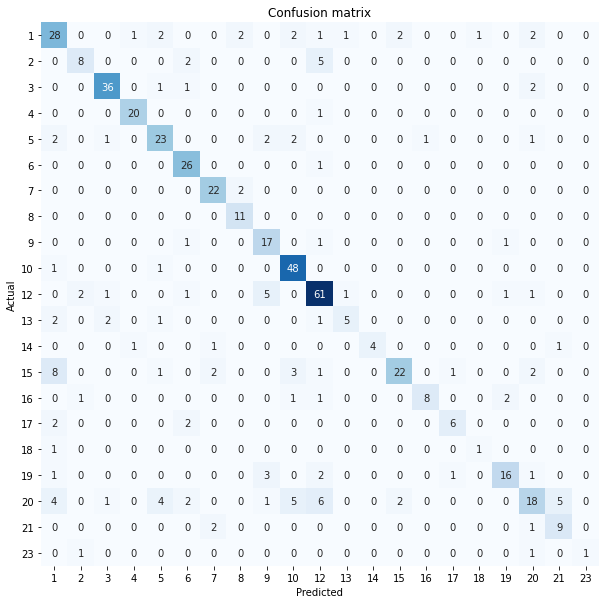

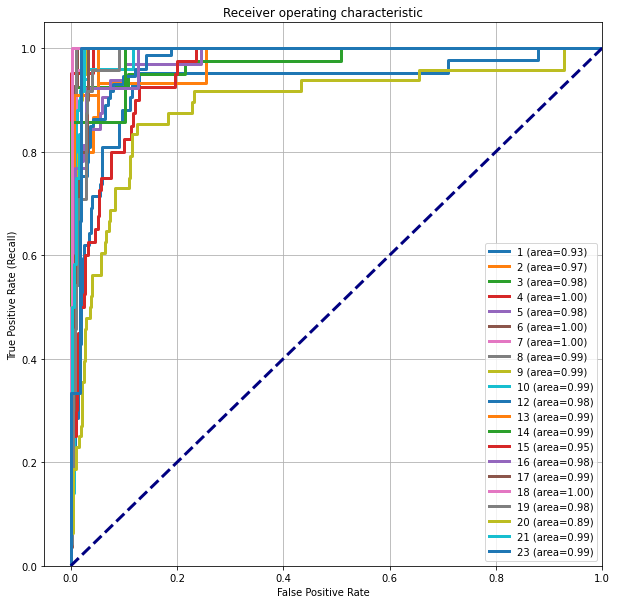

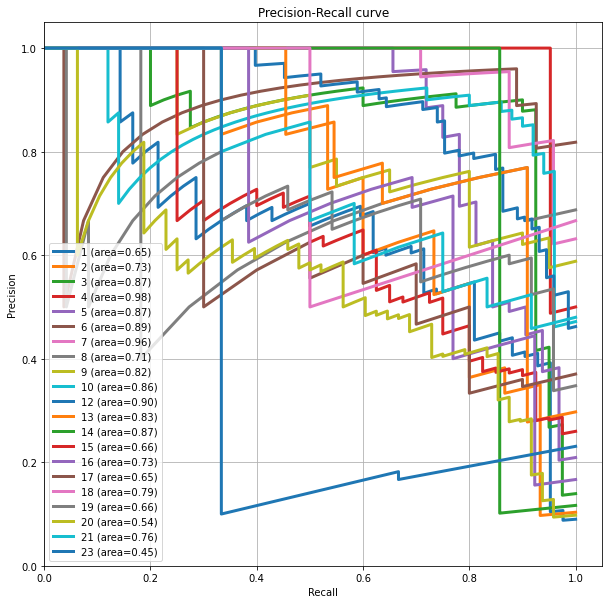

True: 1 --> Pred: 1 | Prob: 0.16


c:\users\berto\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


--------------- Fold:  2 ---------------------

Accuracy: 0.72
Auc: 0.97
Detail:
              precision    recall  f1-score   support

           1       0.62      0.67      0.64        42
           2       0.62      0.53      0.57        15
           3       0.80      0.93      0.86        40
           4       0.72      0.86      0.78        21
           5       0.65      0.53      0.59        32
           6       0.75      1.00      0.86        27
           7       0.68      0.96      0.79        24
           8       0.64      0.82      0.72        11
           9       0.59      0.65      0.62        20
          10       0.78      0.94      0.85        50
          12       0.74      0.88      0.80        72
          13       0.71      0.45      0.56        11
          14       0.60      0.86      0.71         7
          15       0.75      0.38      0.50        40
          16       0.80      0.92      0.86        13
          17       0.71      0.50      0.59        10


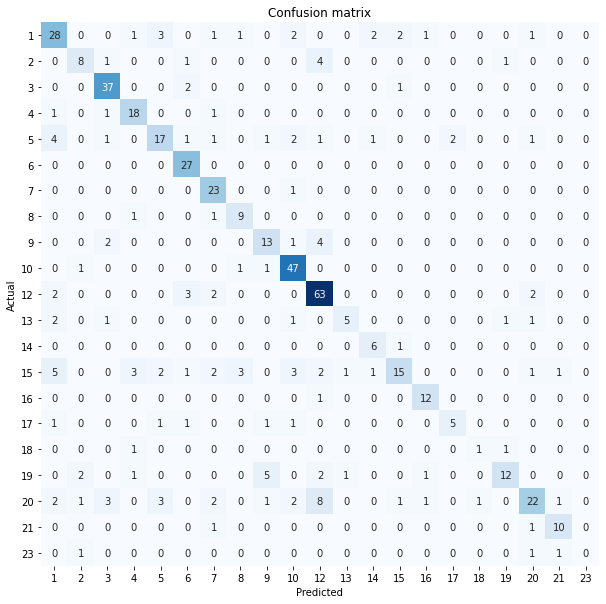

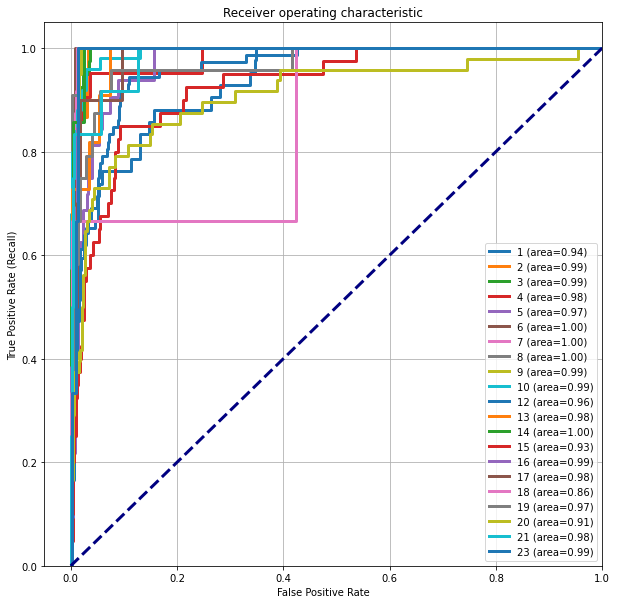

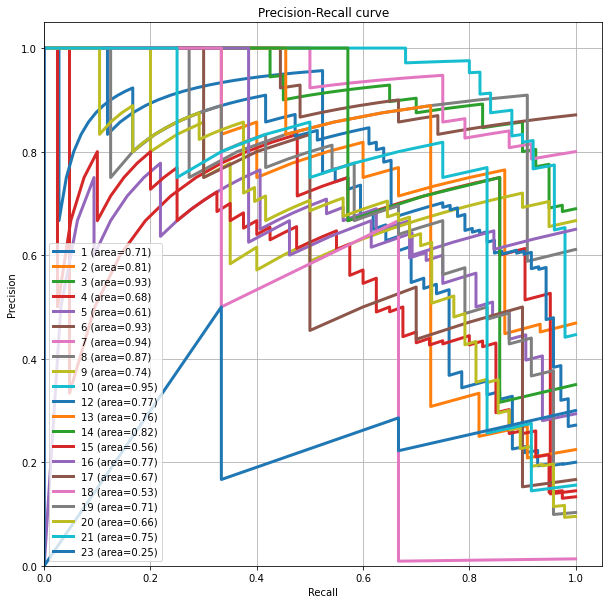

True: 15 --> Pred: 7 | Prob: 0.07


--------------- Fold:  3 ---------------------

Accuracy: 0.74
Auc: 0.97
Detail:
              precision    recall  f1-score   support

           1       0.55      0.69      0.61        42
           2       0.75      0.60      0.67        15
           3       0.77      0.85      0.81        40
           4       0.83      0.75      0.79        20
           5       0.68      0.70      0.69        33
           6       0.73      0.96      0.83        28
           7       0.70      0.96      0.81        24
           8       0.69      0.82      0.75        11
           9       0.75      0.75      0.75        20
          10       0.90      0.88      0.89        50
          12       0.76      0.88      0.81        72
          13       0.86      0.55      0.67        11
          14       1.00      0.71      0.83         7
          15       0.72      0.53      0.61        40
          16       0.71      0.77      0.74        13
          17       0.80      0.80      0.80        10


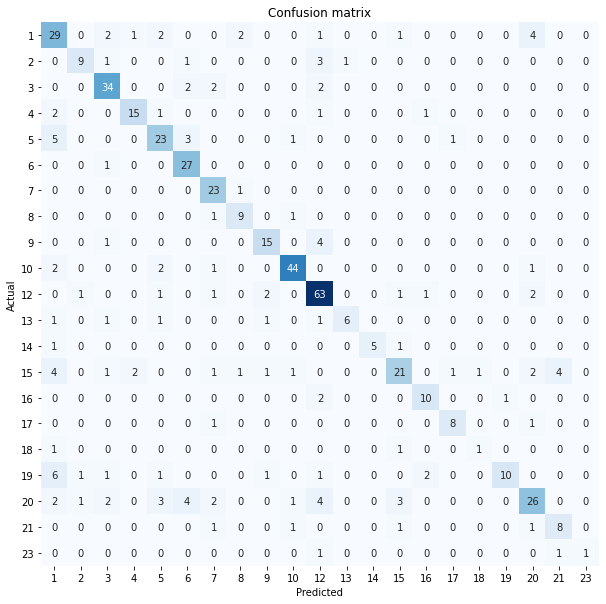

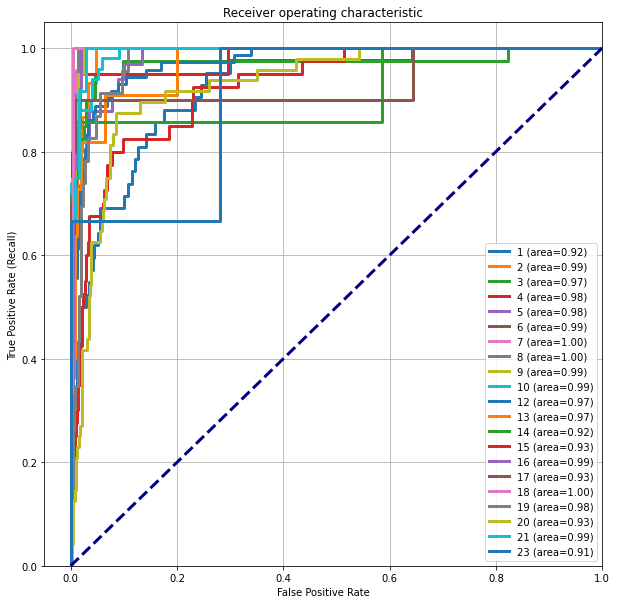

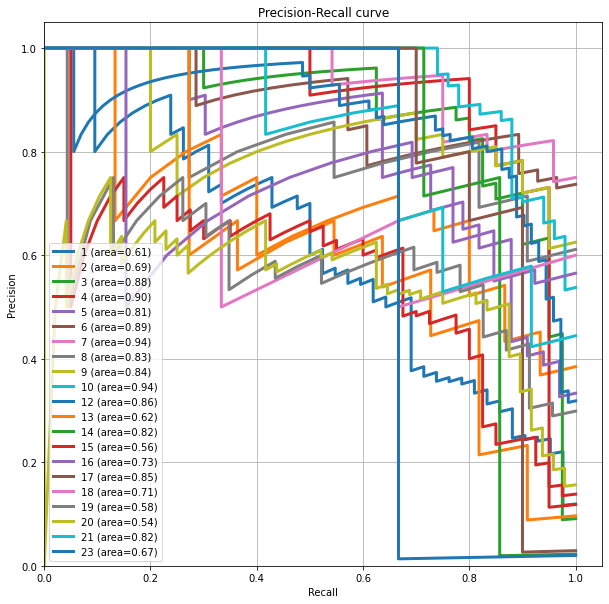

True: 1 --> Pred: 1 | Prob: 0.15


--------------- Fold:  4 ---------------------

Accuracy: 0.72
Auc: 0.97
Detail:
              precision    recall  f1-score   support

           1       0.72      0.69      0.71        42
           2       1.00      0.50      0.67        14
           3       0.84      0.90      0.87        40
           4       0.74      1.00      0.85        20
           5       0.60      0.76      0.67        33
           6       0.72      0.93      0.81        28
           7       0.67      0.83      0.74        24
           8       0.91      0.91      0.91        11
           9       0.65      0.75      0.70        20
          10       0.80      0.88      0.84        50
          12       0.74      0.88      0.80        72
          13       0.40      0.18      0.25        11
          14       0.50      0.43      0.46         7
          15       0.66      0.53      0.58        40
          16       0.62      0.62      0.62        13
          17       0.75      0.60      0.67        10


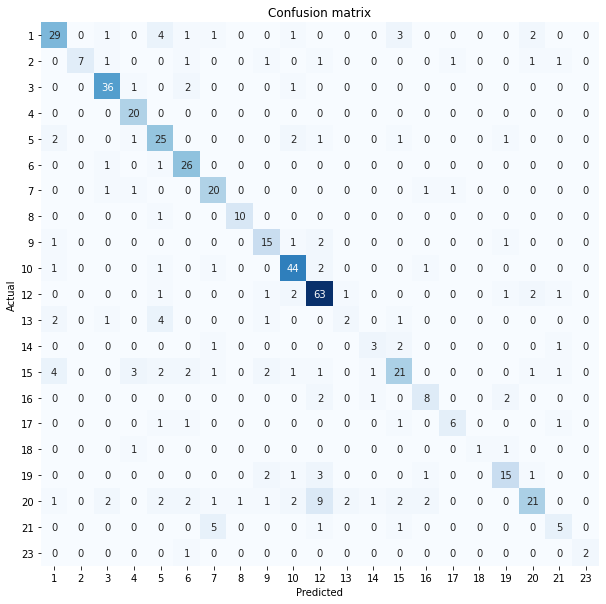

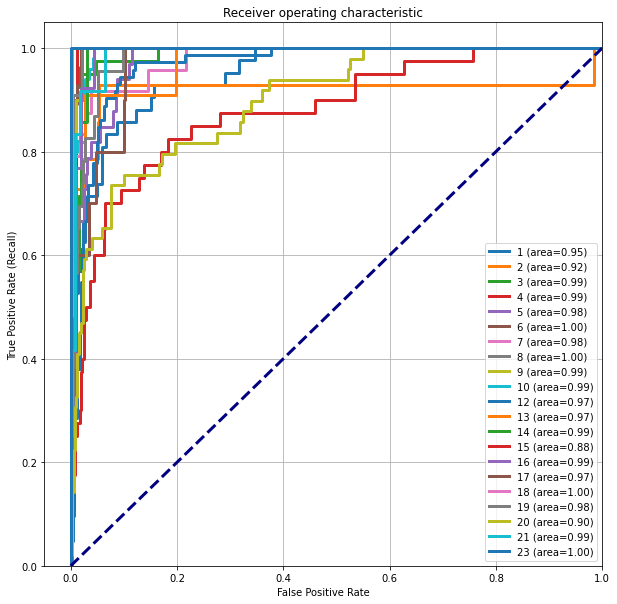

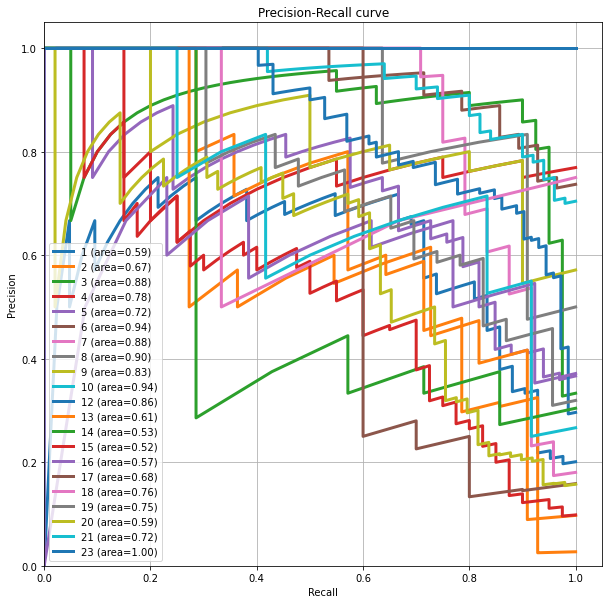

True: 1 --> Pred: 1 | Prob: 0.08


--------------- Fold:  5 ---------------------

Accuracy: 0.71
Auc: 0.97
Detail:
              precision    recall  f1-score   support

           1       0.61      0.64      0.63        42
           2       0.36      0.29      0.32        14
           3       0.90      0.93      0.91        40
           4       0.72      0.90      0.80        20
           5       0.59      0.73      0.65        33
           6       0.77      0.96      0.86        28
           7       0.65      0.74      0.69        23
           8       0.60      0.82      0.69        11
           9       0.62      0.75      0.68        20
          10       0.80      0.98      0.88        50
          12       0.81      0.78      0.79        72
          13       0.75      0.27      0.40        11
          14       0.83      0.71      0.77         7
          15       0.61      0.47      0.54        40
          16       0.91      0.71      0.80        14
          17       0.55      0.60      0.57        10


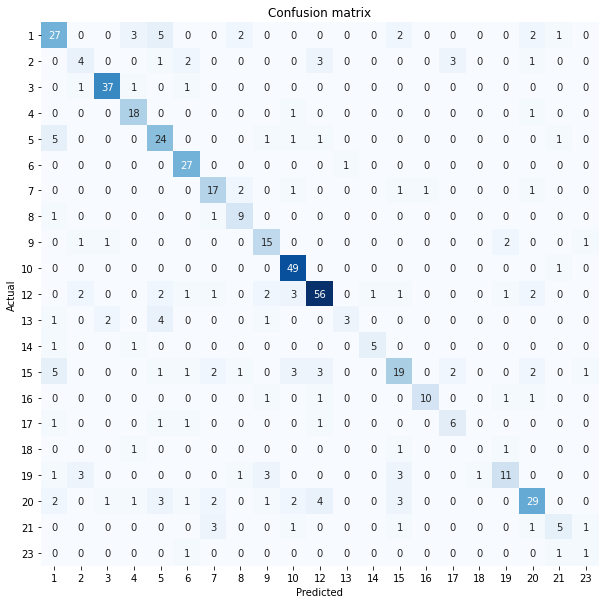

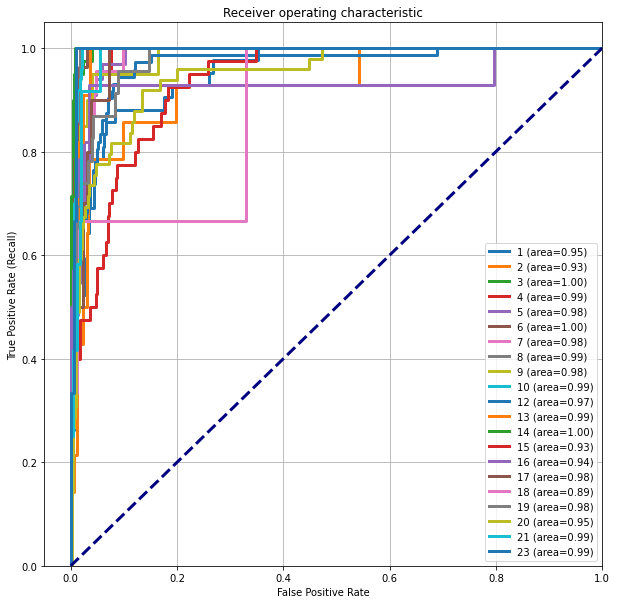

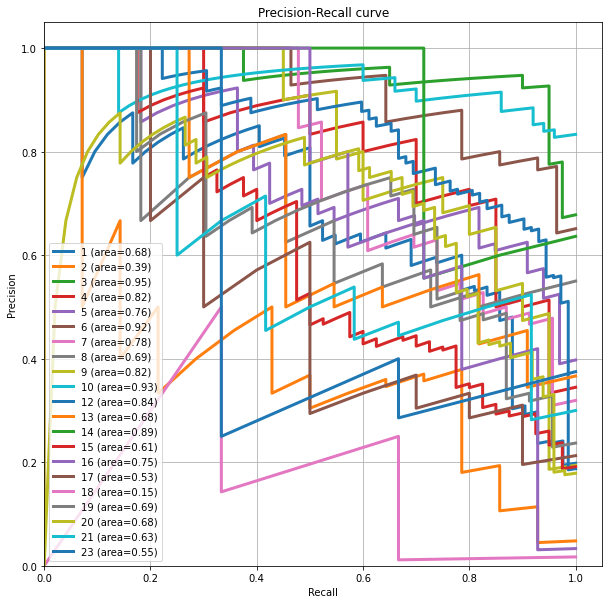

True: 1 --> Pred: 1 | Prob: 0.1


c:\users\berto\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


--------------- Fold:  6 ---------------------

Accuracy: 0.7
Auc: 0.97
Detail:
              precision    recall  f1-score   support

           1       0.59      0.71      0.65        42
           2       0.71      0.36      0.48        14
           3       0.78      0.90      0.84        40
           4       0.85      0.85      0.85        20
           5       0.61      0.70      0.65        33
           6       0.62      0.93      0.75        27
           7       0.66      0.79      0.72        24
           8       0.62      0.73      0.67        11
           9       0.77      0.85      0.81        20
          10       0.80      0.94      0.86        51
          12       0.74      0.76      0.75        72
          13       0.43      0.27      0.33        11
          14       0.71      0.71      0.71         7
          15       0.81      0.53      0.64        40
          16       0.62      0.57      0.59        14
          17       0.71      0.50      0.59        10
 

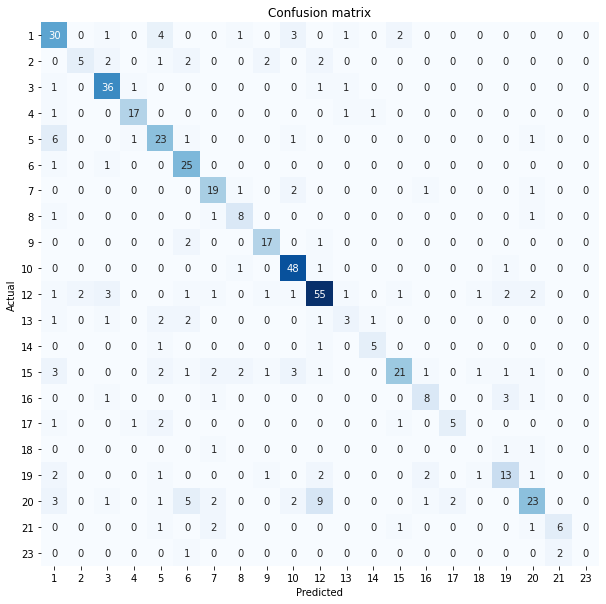

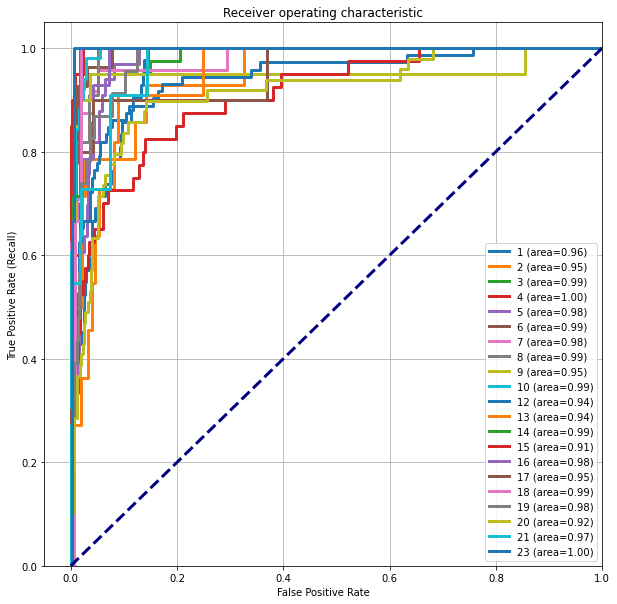

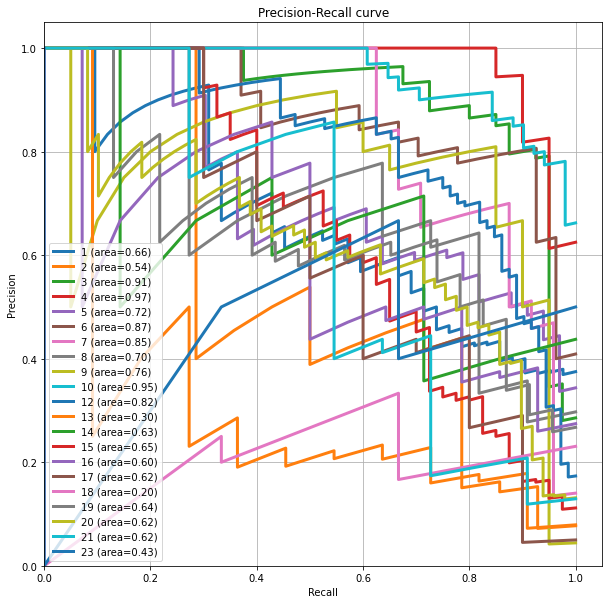

True: 1 --> Pred: 1 | Prob: 0.08


--------------- Fold:  7 ---------------------

Accuracy: 0.71
Auc: 0.97
Detail:
              precision    recall  f1-score   support

           1       0.63      0.74      0.68        42
           2       0.56      0.36      0.43        14
           3       0.85      0.80      0.83        41
           4       0.78      0.90      0.84        20
           5       0.62      0.66      0.64        32
           6       0.57      0.96      0.71        27
           7       0.70      0.88      0.78        24
           8       0.90      0.82      0.86        11
           9       0.88      0.71      0.79        21
          10       0.79      0.96      0.87        51
          12       0.70      0.79      0.75        72
          13       0.75      0.27      0.40        11
          14       0.56      0.71      0.63         7
          15       0.62      0.46      0.53        39
          16       0.64      0.54      0.58        13
          17       0.77      0.91      0.83        11


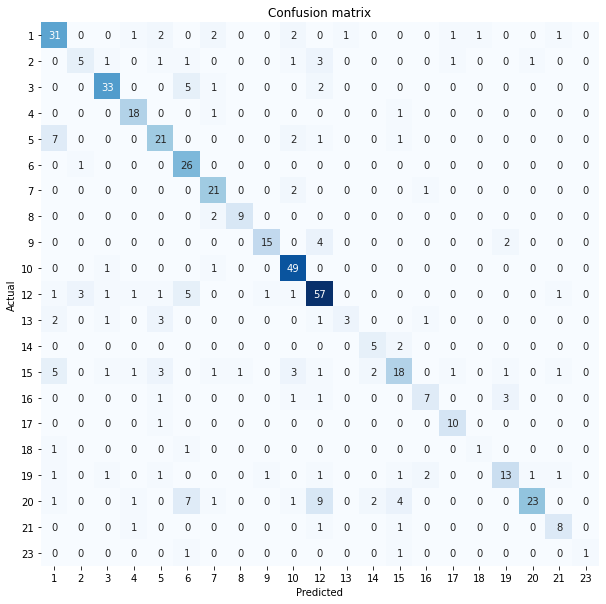

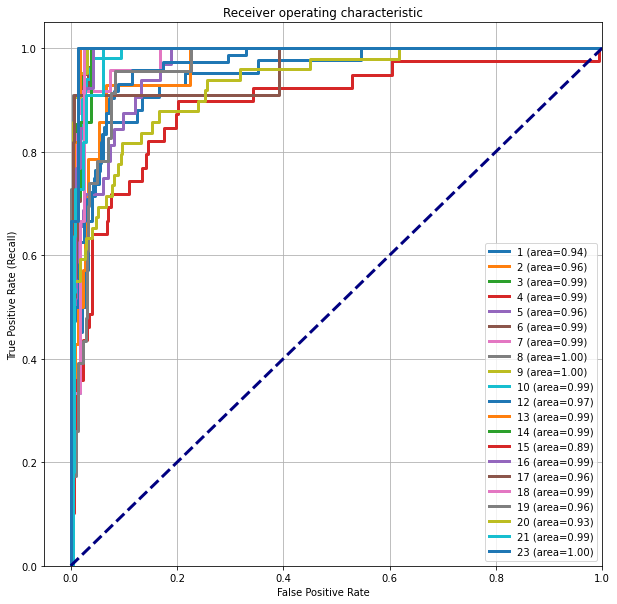

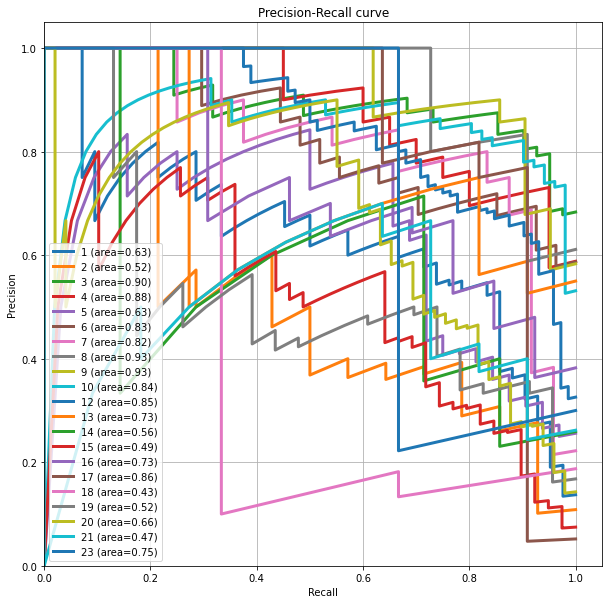

True: 12 --> Pred: 1 | Prob: 0.05


c:\users\berto\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


--------------- Fold:  8 ---------------------

Accuracy: 0.75
Auc: 0.96
Detail:
              precision    recall  f1-score   support

           1       0.71      0.76      0.74        42
           2       0.80      0.29      0.42        14
           3       0.83      0.98      0.90        41
           4       0.72      0.86      0.78        21
           5       0.74      0.72      0.73        32
           6       0.61      0.93      0.74        27
           7       0.66      0.88      0.75        24
           8       0.78      0.70      0.74        10
           9       0.86      0.90      0.88        21
          10       0.80      0.96      0.88        51
          12       0.82      0.88      0.85        72
          13       1.00      0.50      0.67        10
          14       1.00      0.75      0.86         8
          15       0.86      0.47      0.61        40
          16       0.71      0.77      0.74        13
          17       0.75      0.60      0.67        10


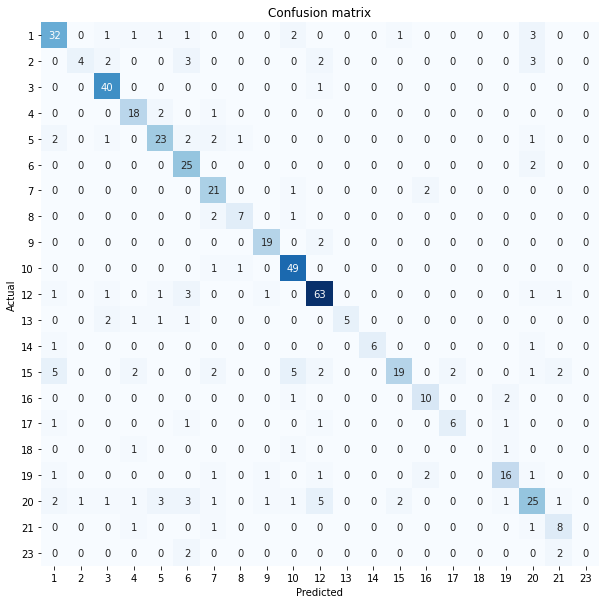

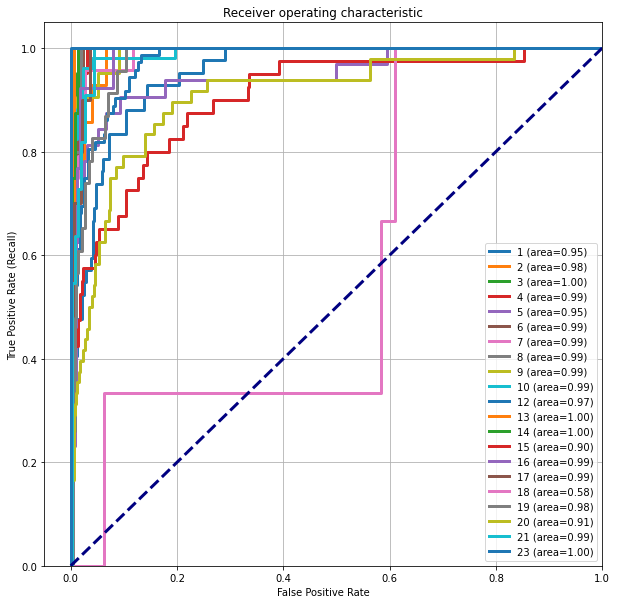

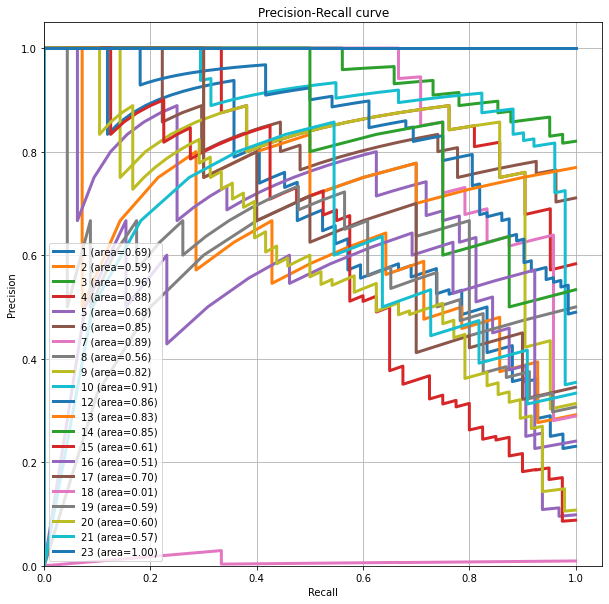

True: 1 --> Pred: 1 | Prob: 0.1


c:\users\berto\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


--------------- Fold:  9 ---------------------

Accuracy: 0.73
Auc: 0.97
Detail:
              precision    recall  f1-score   support

           1       0.60      0.74      0.66        42
           2       0.71      0.36      0.48        14
           3       0.80      0.95      0.87        41
           4       0.80      0.95      0.87        21
           5       0.72      0.66      0.69        32
           6       0.74      0.96      0.84        27
           7       0.69      0.83      0.75        24
           8       0.69      0.90      0.78        10
           9       0.74      0.95      0.83        21
          10       0.77      0.84      0.80        51
          12       0.76      0.90      0.82        72
          13       0.00      0.00      0.00        10
          14       1.00      0.62      0.77         8
          15       0.71      0.50      0.59        40
          16       0.73      0.62      0.67        13
          17       0.80      0.40      0.53        10


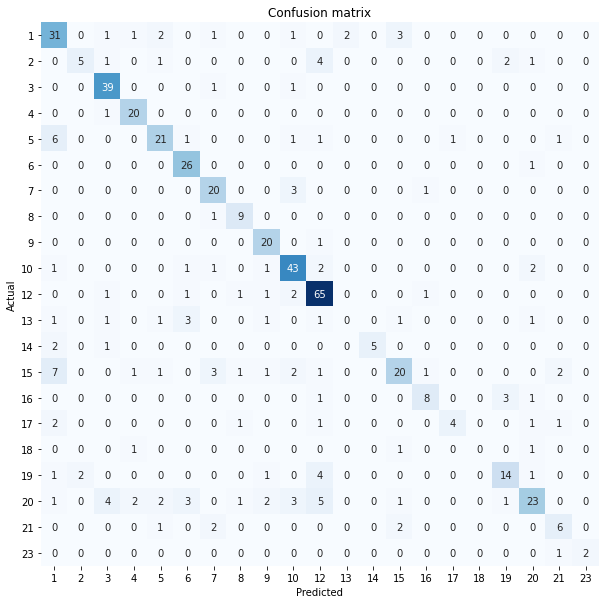

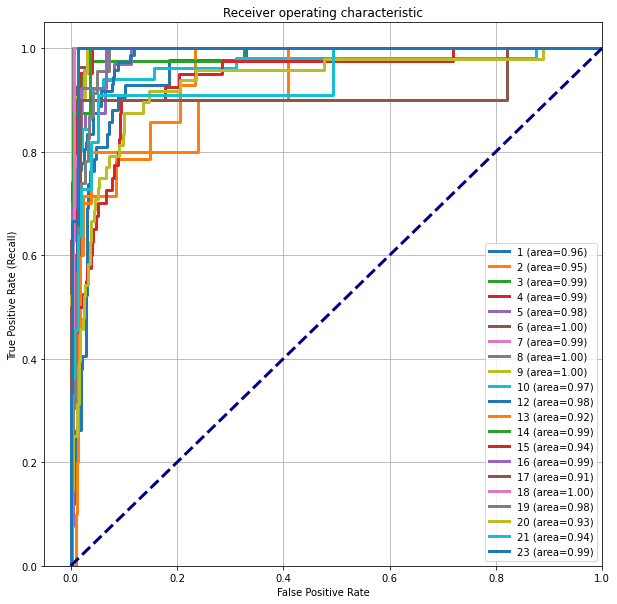

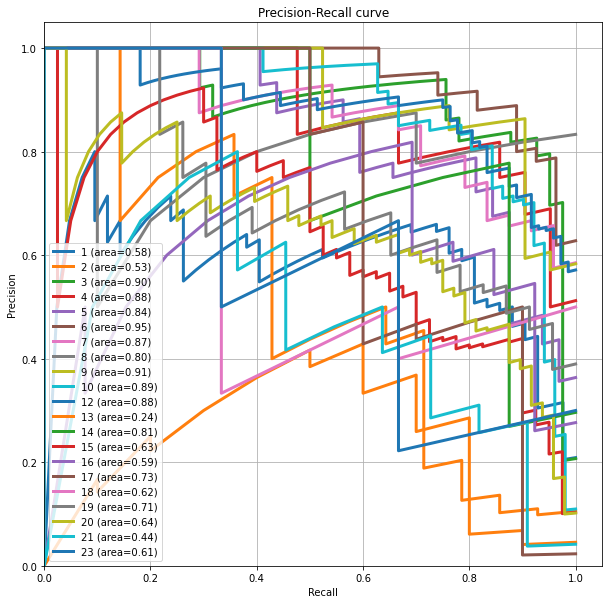

True: 1 --> Pred: 1 | Prob: 0.07


c:\users\berto\appdata\local\programs\python\python38\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


--------------- Fold: 10 ---------------------

Accuracy: 0.75
Auc: 0.97
Detail:
              precision    recall  f1-score   support

           1       0.60      0.74      0.66        42
           2       0.67      0.43      0.52        14
           3       0.82      0.90      0.86        40
           4       0.78      0.86      0.82        21
           5       0.78      0.78      0.78        32
           6       0.81      0.93      0.86        27
           7       0.79      0.92      0.85        24
           8       0.71      1.00      0.83        10
           9       0.65      1.00      0.78        20
          10       0.81      0.92      0.86        51
          12       0.76      0.86      0.81        72
          13       0.67      0.40      0.50        10
          14       0.86      0.75      0.80         8
          15       0.68      0.42      0.52        40
          16       0.75      0.69      0.72        13
          17       0.60      0.60      0.60        10


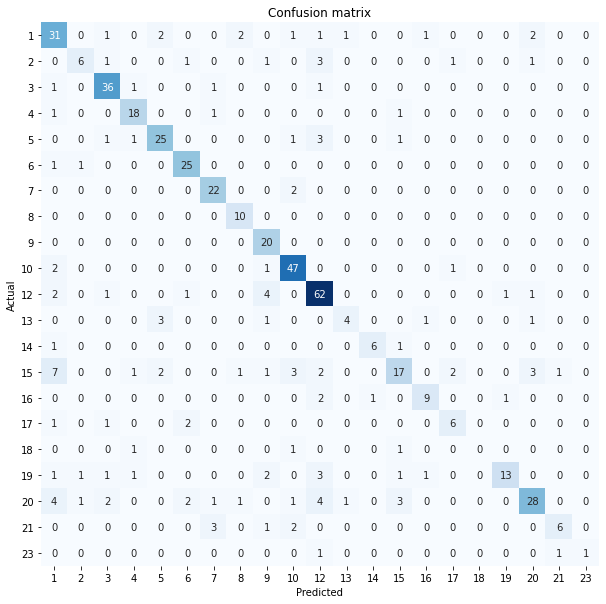

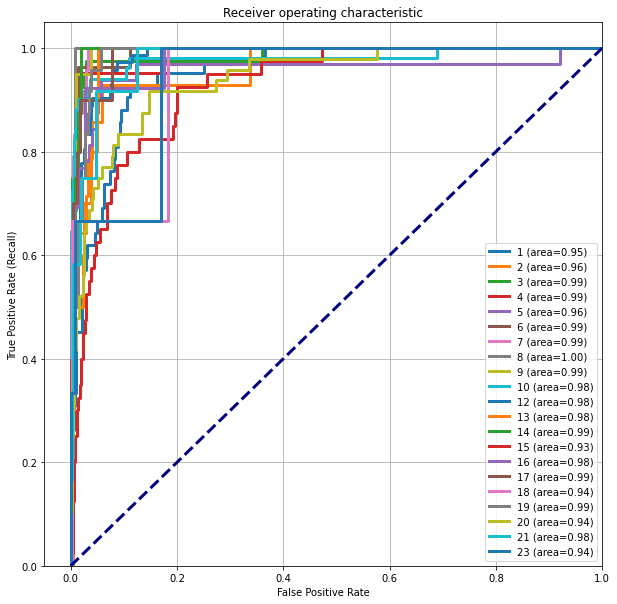

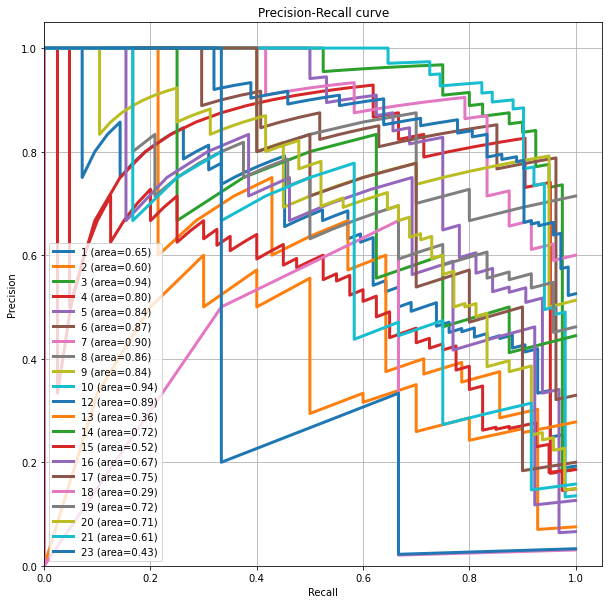

True: 1 --> Pred: 1 | Prob: 0.14


Overall results of the cross-validation procedure


CV accuracy: 72.7 +/- 1.7

CV precision: 72.8 +/- 1.9

CV recall: 72.7 +/- 1.7

CV f1: 71.5 +/- 1.7


In [15]:
X=np.array(documents)
y=np.array(classes)
kfold = StratifiedKFold(n_splits=nfold,shuffle=True,random_state=1).split(X, y)

accuracys = []
scores= []
target_names=list(map(str,np.unique(classes)))

for k, (train, test) in enumerate(kfold):
    pipe_lr.fit(X[train], y[train])
    y_pred=pipe_lr.predict(X[test])
    y_prob=pipe_lr.predict_proba(X[test])
    y_test_array = pd.get_dummies(y[test], drop_first=False).values
    
    ## calcolo accuracy
    accuracy = pipe_lr.score(X[test], y[test])
    accuracys.append(accuracy)
    
    ## calcolo precision,recall,fscore
    auc = metrics.roc_auc_score(y[test], y_prob, multi_class="ovr")
    score=precision_recall_fscore_support(y_true=y[test], y_pred=y_pred, average="weighted")
    scores.append(score[0:3])
    
    print('--------------- Fold: %2d ---------------------'% (k+1))
    print()
    print("Accuracy:",  round(accuracy,2))
    print("Auc:", round(auc,2))
    print("Detail:")
    print(metrics.classification_report(y[test], y_pred))
    
    ## Plot confusion matrix
    conf_mat = confusion_matrix(y[test], y_pred)
    fig, ax = plt.subplots(figsize=(10,10))
    sns.heatmap(conf_mat, annot=True, fmt='d', ax=ax, cbar=False,cmap=plt.cm.Blues)
    ax.set(xlabel="Predicted", ylabel="Actual", xticklabels=target_names, 
           yticklabels=target_names, title="Confusion matrix")
    plt.yticks(rotation=0)
    
    print()
    
    ## Plot Roc
    fig, ax = plt.subplots(figsize=(10,10))
    for i in range(len(target_names)):
        fpr, tpr, thresholds = metrics.roc_curve(y_test_array[:,i],  
                               y_prob[:,i])
        ax.plot(fpr, tpr, lw=3, 
                  label='{0} (area={1:0.2f})'.format(target_names[i], 
                                  metrics.auc(fpr, tpr))
                   )
    ax.plot([0,1], [0,1], color='navy', lw=3, linestyle='--')
    ax.set(xlim=[-0.05,1.0], ylim=[0.0,1.05], 
              xlabel='False Positive Rate', 
              ylabel="True Positive Rate (Recall)", 
              title="Receiver operating characteristic")
    ax.legend(loc="lower right")
    ax.grid(True)
    
    ## Plot precision-recall curve
    fig, ax = plt.subplots(figsize=(10,10))
    for i in range(len(target_names)):
        precision, recall, thresholds = metrics.precision_recall_curve(
                     y_test_array[:,i], y_prob[:,i])
        ax.plot(recall, precision, lw=3, 
                   label='{0} (area={1:0.2f})'.format(target_names[i], 
                                      metrics.auc(recall, precision))
                  )
    ax.set(xlim=[0.0,1.05], ylim=[0.0,1.05], xlabel='Recall', 
              ylabel="Precision", title="Precision-Recall curve")
    ax.legend(loc="best")
    ax.grid(True)
    plt.show()
    
    ## select observation
    i = 0
    txt_instance = X[test][i]
    ## check true value and predicted value
    print("True:", y[test][i], "--> Pred:", y_pred[i], "| Prob:", round(np.max(y_prob[i]),2))
    ## show explanation
    explainer = lime_text.LimeTextExplainer(class_names=target_names)
    explained = explainer.explain_instance(txt_instance, 
                 pipe_lr.predict_proba, num_features=6,top_labels=2)
    explained.show_in_notebook(text=txt_instance, predict_proba=False)

    
arr = np.array(scores)

print("Overall results of the cross-validation procedure")
print()

print('\nCV accuracy: %.1f +/- %.1f' % (np.mean(accuracys)*100, np.std(accuracys)*100))
print('\nCV precision: %.1f +/- %.1f' % (np.mean(arr[:,0])*100, np.std(arr[:,0])*100))
print('\nCV recall: %.1f +/- %.1f' % (np.mean(arr[:,1])*100, np.std(arr[:,1])*100))
print('\nCV f1: %.1f +/- %.1f' % (np.mean(arr[:,2])*100, np.std(arr[:,2])*100))